In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import matplotlib.gridspec as gridspec
import glob
import cv2
import math
import os
%matplotlib inline

## 1. Camera Calibration
First goal of the project is a function to compute the camera calibration matrix and distortion coefficients given a set of chessboard images. Finding all the corners of the different chessboards allow us to create a matrix of corner points in the image space, and in the real space. What this mapping does is that in combination with the distortion feature, the camera matrix and the distortion coefficients are obtained to accurately translate all images taken later on. 

In [2]:
def cameraCalibration(saveImages):
    print('Running Camera Calibration .... ')    
    nx = 9
    ny = 6
    
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob('camera_cal/calibration*.jpg')
#     images = glob.glob('camera_cal/calibration*.jpg')
    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
        img = mpimg.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
            if saveImages == 'y':
                # Draw and display the corners
                cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
                write_name = 'cornersFound'+str(idx)+'.jpg'
                cv2.imwrite('camera_cal/corners/'+write_name, img)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (img.shape[1], img.shape[0]), None, None)

    if saveImages == 'y':
        img = cv2.imread('camera_cal/calibration1.jpg')
        distort = cv2.undistort(img, mtx, dist, None, mtx)
        cv2.imwrite('outputImages/chessboardUndistort.jpg', distort)    
        cv2.imwrite('outputImages/chessboardRaw.jpg', img)            
        
#         for idx, fname in enumerate(images):
#             img = cv2.imread(fname)
#             distort = cv2.undistort(img, mtx, dist, None, mtx)
#             write_name = 'undistorted'+str(idx)+'.jpg'
#             cv2.imwrite('output_images/'+write_name, img)    
        print('Done! Calibration & Undistorted images saved in "output_images"')
    else: print('Done!')    
    print("=========")
    return mtx, dist

mtx,dist=cameraCalibration(saveImages='n')
# mtx,dist=cameraCalibration(saveImages='y')

Running Camera Calibration .... 
Done!


## 2.1 Distortion

In [3]:
# Obtains the undistored image from the calibrated one
def distortion (img,mtx,dist):
    return cv2.undistort(img, mtx, dist, None, mtx)



## 2.2	Color Transformations & Gradients

In [4]:
# scales image to 8 bit
def scale8bit (img):
    imgScaled = np.uint8(255*img/np.max(img))
    return imgScaled

# applies a threshold in order to obtain binary images if the threshold conditions are met
def binaryThresh (img, threshold):
    binaryOut = np.zeros_like(img)
    binaryOut[ (img >= threshold[0] ) & (img <= threshold[1])  ] = 1
    return binaryOut

# gets binary images of the sobelx and sobely meeting certain thresholds
def absSobelTh (img,axis='x',skernel=3,threshold=(0,255)):
    if axis == 'x':
        sobel = cv2.Sobel(img, cv2.CV_64F,1,0,skernel)
    if axis == 'y':
        sobel = cv2.Sobel(img, cv2.CV_64F,1,0,skernel)
    sobelAbs = np.absolute(sobel)
    sobelScaled = scale8bit(sobelAbs)
    absSobelBin = binaryThresh(sobelScaled,threshold)
    return absSobelBin

# gets binary images of the gradient magnitude meeting certain thresholds
def gradMagTh (img,skernel=3,threshold=(0,255)):
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, skernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, skernel)
    gradMag = np.sqrt(sobelx*sobelx + sobely*sobely)
    gradMagScaled = scale8bit(gradMag)
    gradMagBin = binaryThresh(gradMagScaled,threshold)
    return gradMagBin

# gets binary images of the gradient direction meeting certain thresholds
def dirTh (img,skernel=3,threshold=(0,(np.pi/2))):
    absSobelx = np.absolute(cv2.Sobel(img, cv2.CV_64F, 1, 0, skernel))
    absSobely = np.absolute(cv2.Sobel(img, cv2.CV_64F, 0, 1, skernel))
    direction = np.arctan2(absSobely, absSobelx)
    directionBin = binaryThresh(direction,threshold)
    return directionBin

# gets binary images of the S-channel converted data meeting certain thresholds
def sColorTh (img,threshold=(0,255)):
    hls = cv2.cvtColor(img,cv2.COLOR_BGR2HLS)
    sChannel = hls[:,:,2]
    sBinary = binaryThresh(sChannel,threshold)
    return sBinary

# combines all the gradient thresholds in one step
def allGradientsTh (img,skernel=3,gradx_thr=(0,255),grady_thr=(0,255),mag_thr=(0,255),dir_thr=(0,(np.pi/2))):
    gradx = absSobelTh(img, 'x', skernel, gradx_thr)
    grady = absSobelTh(img, 'y', skernel, grady_thr)
    mag_binary = gradMagTh(img, skernel, mag_thr)
    dir_binary = dirTh(img, skernel, dir_thr)
    
    allGradientsBin = np.zeros_like(dir_binary)
    allGradientsBin[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    return allGradientsBin

### 2.3 Perspective Transformation

In [5]:
# transforms an image from a driver view to a birds-eye view
def perspectiveTransform(img,src,dst):
    h,w = img.shape[:2]
    if  (src is None) & (dst is None):
        # Trapezium points on image
        src = np.float32([(w/32,0.95*h), (w/2-w/18,0.625*h), (w/2+w/18,0.625*h), (31*w/32,0.95*h)], dtype=np.int32)
        # Rectangle desired points in destination
        dst = np.float32([(150,h), (150,0), (w-150,0), (w-150,h)], dtype=np.int32)

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)

    return Minv, warped, src, dst


In [6]:
# this is a function used to test the output of the calibration to see if the results are satisfactory
def testCalibration(img,mtx,dist,src,dst):
    distort = distortion (img,mtx,dist)
    f, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.axis('off')
    ax1.imshow(img)
    ax1.set_title('Distorted', fontsize=20)
    Minv, transform, src, dst = perspectiveTransform(distort,src,dst)
    ax2.axis('off')
    ax2.imshow(distort)
    ax2.set_title('Undistorted', fontsize=20)
    src = np.vstack((src, src[0::]))
    ax2.plot(src[:,0],src[:,1])
    ax3.axis('off')
    ax3.imshow(transform)
    ax3.set_title('Perspective Transformed', fontsize=20)
    
    plt.figure(figsize=(32,18))
    plt.imshow(transform)
    plt.axis('off')
    plt.plot(dst[:,0],dst[:,1],color=(0,1,1),linewidth=6)
    plt.savefig('outputImages/3_3_lanetransform.jpg')

    plt.figure(figsize=(32,18))
    plt.imshow(distort)
    plt.axis('off')
    plt.plot(src[:,0],src[:,1],color=(0,1,1),linewidth=6)
    plt.savefig('outputImages/3_3_lanedistort.jpg')

    
# mtx,dist = cameraCalibration('n')
# print('Test Output of Camera Calibration (including distortion)')
# # testCalibration(mpimg.imread('test_images/straight_lines1.jpg'),mtx,dist,None,None)
# # testCalibration(mpimg.imread('test_images/straight_lines2.jpg'),mtx,dist,None,None)
# # testCalibration(mpimg.imread('test_images/test1.jpg'),mtx,dist,None,None)
# # testCalibration(mpimg.imread('test_images/test2.jpg'),mtx,dist,None,None)
# # testCalibration(mpimg.imread('test_images/test3.jpg'),mtx,dist,None,None)
# # testCalibration(mpimg.imread('test_images/test4.jpg'),mtx,dist,None,None)
# testCalibration(mpimg.imread('test_images/test5.jpg'),mtx,dist,None,None)
# testCalibration(mpimg.imread('test_images/test6.jpg'),mtx,dist,None,None)


### 2.4 Lane-line Identification

In [7]:
# Determine start point by finding Histogram Peaks of bottom half of image
def histPeaks (img):
    h,w = img.shape[:2]
    histogram = np.sum(img[h//2:,:],axis=0)
    margin = 50
    leftXStart = np.argmax(histogram[margin:((histogram.shape[0]//2)-margin)])
    rightXStart = np.argmax(histogram[(histogram.shape[0]//2+margin):-margin])+histogram.shape[0]//2
#     plt.figure(figsize=(32,18))
#     plt.axis('off')
#     plt.imshow(img)
#     plt.plot((h-4*histogram),linewidth=6)
# #     x2.plot(h-histogram,linewidth=8)    
#     plt.savefig('outputImages/2_4_histogram.jpg')
#     print(leftXStart-rightXStart)
    return leftXStart,rightXStart

# makes use of the sliding windows technique to search for points of interest
def slidingWindows(img):
    h,w = img.shape[:2]
    imgOut = np.dstack((img, img, img))
#    imgOut = copy.copy(img)
    
    leftXStart,rightXStart = histPeaks(img)
    nWindows = 12
    margin = 70
    # min num of pixels to recenter windowbox
    minPix = 50
    
    winH = np.int(img.shape[0]//nWindows)
    
    lXCurr = leftXStart
    rXCurr = rightXStart
    
    lLaneIdx = []
    rLaneIdx = []
    
    nonzeroy = img.nonzero()[0]
    nonzerox = img.nonzero()[1]

    
    for window in range(nWindows):        
        winYbottom = h - (window+1)*winH
        winYtop    = h - (window)*winH
        
        winLXleft  = lXCurr - margin 
        winLXright = lXCurr + margin
    
        winRXleft  = rXCurr - margin 
        winRXright = rXCurr + margin 
        
        #draw current window of interest
        imgOut=cv2.rectangle(imgOut,(winLXleft,winYbottom),(winLXright,winYtop),(0,255,0),2)
        imgOut=cv2.rectangle(imgOut,(winRXleft,winYbottom),(winRXright,winYtop),(0,255,0),2)
        
        
        # Identify the nonzero pixels in x and y within the window #
        lPointsIdx = ((nonzerox >= winLXleft) &  (nonzerox < winLXright) & (nonzeroy >= winYbottom) & (nonzeroy < winYtop)).nonzero()[0]
        rPointsIdx = ((nonzerox >= winRXleft) &  (nonzerox < winRXright) & (nonzeroy >= winYbottom) & (nonzeroy < winYtop)).nonzero()[0]

        # Append these indices to the lists
        lLaneIdx.append(lPointsIdx)
        rLaneIdx.append(rPointsIdx)

        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(lPointsIdx) > minPix:
            lXCurr = np.int(np.mean(nonzerox[lPointsIdx]))
        if len(rPointsIdx) > minPix:        
            rXCurr = np.int(np.mean(nonzerox[rPointsIdx]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        lLaneIdx = np.concatenate(lLaneIdx)
        rLaneIdx = np.concatenate(rLaneIdx)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass
    
    leftx = nonzerox[lLaneIdx]
    lefty = nonzeroy[lLaneIdx] 
    rightx = nonzerox[rLaneIdx]
    righty = nonzeroy[rLaneIdx]
    
    if leftx is not None:
        lCoeff = np.polyfit(lefty, leftx, 2)
    if rightx is not None:
        rCoeff = np.polyfit(righty, rightx, 2)

    lxTop = lCoeff[2]
    rxTop = rCoeff[2]
    lxBottom = lCoeff[0]*h**2 + lCoeff[1]*h + lCoeff[2]
    rxBottom = rCoeff[0]*h**2 + rCoeff[1]*h + rCoeff[2]

    if lineCheck(laneWidth = rxTop-lxTop) | lineCheck(laneWidth = rxBottom-lxBottom):
        switch = True
    else: switch=False
#     print(rxTop-lxTop,rxBottom-lxBottom)    
    imgOut[lefty, leftx] = [0, 255, 255]
    imgOut[righty, rightx] = [255, 255, 0]        

    return lCoeff, rCoeff, lLaneIdx,rLaneIdx, imgOut, switch
    
# makes use of prior results to more efficiently obtain the points of interest    
def searchFromPrior(img, lCoeffPrev, rCoeffPrev):
    imgOut = np.dstack((img, img, img))
    h,w=img.shape[:2]
    lLaneIdx = []
    rLaneIdx = []
    margin = 100
    nonzeroy = np.array(img.nonzero()[0])
    nonzerox = np.array(img.nonzero()[1])

    lLaneIdx = ((nonzerox > (lCoeffPrev[0]*nonzeroy**2 + lCoeffPrev[1]*nonzeroy + lCoeffPrev[2]) - margin ) &
               (nonzerox < (lCoeffPrev[0]*nonzeroy**2 + lCoeffPrev[1]*nonzeroy + lCoeffPrev[2]) + margin ) )
    
    rLaneIdx = ((nonzerox > (rCoeffPrev[0]*nonzeroy**2 + rCoeffPrev[1]*nonzeroy + rCoeffPrev[2]) - margin ) &
               (nonzerox < (rCoeffPrev[0]*nonzeroy**2 + rCoeffPrev[1]*nonzeroy + rCoeffPrev[2]) + margin ) )

        
    leftx = nonzerox[lLaneIdx]
    lefty = nonzeroy[lLaneIdx] 
    rightx = nonzerox[rLaneIdx]
    righty = nonzeroy[rLaneIdx]

    imgOut[lefty, leftx] = [0, 255, 255]
    imgOut[righty, rightx] = [255, 255, 0]    
    
    if leftx is not None:
        lCoeffNew = np.polyfit(lefty, leftx, 2)
    if rightx is not None:
        rCoeffNew = np.polyfit(righty, rightx, 2)

    plotY = np.linspace(0, img.shape[0]-1, img.shape[0] )
    lLinePrev = lCoeffPrev[0]*plotY**2 + lCoeffPrev[1]*plotY + lCoeffPrev[2]
    rLinePrev = rCoeffPrev[0]*plotY**2 + rCoeffPrev[1]*plotY + rCoeffPrev[2]    
    
    left_line_window1 = np.array([np.transpose(np.vstack([lLinePrev-margin, plotY]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([lLinePrev+margin, plotY])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([rLinePrev-margin, plotY]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([rLinePrev+margin, plotY])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(imgOut, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(imgOut, np.int_([right_line_pts]), (0,255, 0)) 
    
    lxTop = lCoeffNew[2]
    rxTop = rCoeffNew[2]
    lxBottom = lCoeffNew[0]*h**2 + lCoeffNew[1]*h + lCoeffNew[2]
    rxBottom = rCoeffNew[0]*h**2 + rCoeffNew[1]*h + rCoeffNew[2]

    if lineCheck(laneWidth = rxTop-lxTop) | lineCheck(laneWidth = rxBottom-lxBottom):
        switch = True
    else: switch=False
    
    imgOut[lefty, leftx] = [0, 255, 255]
    imgOut[righty, rightx] = [255, 255, 0]
    
    return lCoeffNew,rCoeffNew, lLaneIdx, rLaneIdx, imgOut, switch
    
# checks if the lane meets the minimum or maximum width specified
def lineCheck(laneWidth):
    # lane width should be between 550-800 pixels 
    if (laneWidth < 550) | (laneWidth > 800) :
        switch = True
    else:
        switch = False
    return switch


### 2.5 Radius of Curvature and Vehicle Position

In [8]:
# calculate radius of curvature
def laneCurve(img, coeff,ymPerPix,xmPerPix):
#     leftx = leftx[::-1]
#     yEval = np.max(ploty)
    h,w = img.shape[:2]

    rCurve  = (0)
    distCenter    = (0)
        
    yEval = img.shape[0]-1
    
    # for equation X = Ay^2 + By + C, apply transformation to convert the coefficients to real world values
    A = (xmPerPix / (ymPerPix**2) ) * coeff[0]
    B = (xmPerPix / ymPerPix) * coeff[1]
    C = coeff[2]

    rCurve = (1 + (2*A*h + B)**2)**(3/2) / np.abs(2*A)
    return rCurve

# calculate distance of car/camera from center of lane
def findDist(h,w,xmPerPix,lCoeff,rCoeff):
    # assuming camera is mounted in center of car, car is in the center of frame
    car = w//2
    lLaneX = lCoeff[0]*h**2 + lCoeff[1]*h + lCoeff[2] 
    rLaneX = lCoeff[0]*h**2 + rCoeff[1]*h + rCoeff[2]
    laneCenter = (rLaneX + lLaneX)/2
    distfmCtr = (car - laneCenter) * xmPerPix
    return distfmCtr

# checks if the left and right curve are within an order of magnitude to each other
def curveCheck (lCurve,rCurve):
    if ((lCurve/rCurve) < 0.1) | ((lCurve/rCurve) > 10):
        switch = False
    return switch

### 2.6 Warp the detected lane boundaries back onto the original image & Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position

In [9]:
# draws the lane boundaries mapped back onto original image
def drawLane(img, transformed, Minv, lCoeff, rCoeff):
    newImg = np.copy(img)
    h,w=img.shape[:2]

    warp_zero = np.zeros_like(transformed).astype(np.uint8)
    colorWarp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    plotY = np.linspace(0, img.shape[0]-1, img.shape[0] )
    plotXL = lCoeff[0]*plotY**2 + lCoeff[1]*plotY + lCoeff[2] 
    plotXR = rCoeff[0]*plotY**2 + rCoeff[1]*plotY + rCoeff[2]
 
    lPoints = np.array([np.transpose(np.vstack([plotXL, plotY]))])
    rPoints = np.array([np.flipud(np.transpose(np.vstack([plotXR, plotY])))])
    pts = np.hstack((lPoints, rPoints))

    cv2.fillPoly(colorWarp, np.int_([pts]), (0,255, 0))
    
    retransform = cv2.warpPerspective(colorWarp, Minv, (w, h)) 
    result = cv2.addWeighted(newImg, 1, retransform, 0.5, 0)
    return result

# prints the Rcurve and distFromCenter onto the top RH of the image
def outputData(img,lCurveRad,rCurveRad,distfmCtr):
    newImg = np.copy(img)
    
    cv2.putText(newImg, 'Radius of curvature:', (800,80), cv2.FONT_HERSHEY_SIMPLEX,0.8,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(newImg, '{:.2f}m'.format(np.absolute(lCurveRad+rCurveRad)/2), (1100,80), cv2.FONT_HERSHEY_SIMPLEX,0.8,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(newImg, 'Distance from Center:', (800,140), cv2.FONT_HERSHEY_SIMPLEX,0.8,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(newImg, '{:.2f}m'.format(np.absolute(distfmCtr)), (1150,140), cv2.FONT_HERSHEY_SIMPLEX,0.8,(255,255,255),2,cv2.LINE_AA)

    return newImg

### Main Image Processing Pipeline

In [10]:
def processImage(img,run=0):
    global lCoeffPrev
    global rCoeffPrev
    imgCopy = np.copy(img)

    # 2. Correct for Distortion 
    distort = distortion(imgCopy,mtx,dist)

    # 3. Color and Gradient transforms
    hls  = cv2.cvtColor(distort,cv2.COLOR_BGR2HLS)
    gray = cv2.cvtColor(distort,cv2.COLOR_BGR2GRAY)
    sChannel = hls[:,:,2]

    sBinary = binaryThresh(sChannel,threshold=(170,255))   
    allGradientsBin = allGradientsTh(gray,skernel=3,gradx_thr=(50,120),grady_thr=(50,120),mag_thr=(50,255),dir_thr=(0.7,1.3))

    split = np.dstack((np.zeros_like(sChannel), allGradientsBin, sBinary))

    combined = np.zeros_like(sBinary)
    combined[((allGradientsBin == 1) | (sBinary == 1))] = 1

    
    # 4. Perspective Transform
    Minv, transformed,_,_ = perspectiveTransform(combined,src=None,dst=None)
    
    # 5. Find Lane Lines
    if ("lCoeffPrev" not in globals()) | ("rCoeffPrev" not in globals()):
        lCoeff, rCoeff, lLaneIdx,rLaneIdx, imgOut, switch  = slidingWindows(transformed)   
        imgTitle = "Sliding Windows"
        if (run!=0) & switch is True:
            lCoeff = lCoeffPrev
            rCoeff = rCoeffPrev
        
    else:
        lCoeff, rCoeff, lLaneIdx,rLaneIdx, imgOut, switch  = searchFromPrior(transformed,lCoeffPrev,rCoeffPrev)
        imgTitle = "Prior Search"
        if switch is True:
            lCoeff, rCoeff, lLaneIdx,rLaneIdx, imgOut, switch  = slidingWindows(transformed)
            imgTitle = "Sliding Windows"
            if switch is True:
                lCoeff = lCoeffPrev
                rCoeff = rCoeffPrev

    lCoeffPrev = lCoeff
    rCoeffPrev = rCoeff

    h,w = transformed.shape[:2]
    imgLaneWidth     = 634 # average of all the l&r curve points from all test imgs
    
    ymPerPix = 30  / 720           # LaneLength = 30m realWorld / 720 px
    xmPerPix = 3.7 / imgLaneWidth  # LaneWidth = 3m realWorld / pixels between lanes 
    
    lCurveRad = laneCurve(transformed,lCoeff,ymPerPix,xmPerPix)
    rCurveRad = laneCurve(transformed,rCoeff,ymPerPix,xmPerPix)

#     if (np.absolute(lCoeff[0]) < (ymPerPix**2)/(10000*xmPerPix) ) | (np.absolute(rCoeff[0]) < (ymPerPix**2)/(10000*xmPerPix)) :
#         print("straight road")
#         print(lCurveRad,rCurveRad)
#     else:
#         print("---")
#         print(lCurveRad,rCurveRad)
#     if (lCurveRad > 10000) | (rCurveRad > 10000) :
#         print("straight road")
    

    distfmCtr = findDist(h,w,xmPerPix,lCoeff,rCoeff)
    laneDraw = drawLane (img,combined,Minv, lCoeff, rCoeff )
    result = outputData(laneDraw,lCurveRad,rCurveRad,distfmCtr)
    
    run=1
    return result

### Main Pipeline with frame by frame diagnostics

In [11]:
def processImageDiagnostic(img,run=0):
    global lCoeffPrev
    global rCoeffPrev
    imgCopy = np.copy(img)

    # 2. Correct for Distortion 
    distort = distortion(imgCopy,mtx,dist)

    # 3. Color and Gradient transforms
    hls  = cv2.cvtColor(distort,cv2.COLOR_BGR2HLS)
    gray = cv2.cvtColor(distort,cv2.COLOR_BGR2GRAY)
    sChannel = hls[:,:,2]

    sBinary = binaryThresh(sChannel,threshold=(170,255))   
    allGradientsBin = allGradientsTh(gray,skernel=3,gradx_thr=(50,120),grady_thr=(50,120),mag_thr=(50,255),dir_thr=(0.7,1.3))

    split = np.dstack((np.zeros_like(sChannel), allGradientsBin, sBinary))

    combined = np.zeros_like(sBinary)
    combined[((allGradientsBin == 1) | (sBinary == 1))] = 1

    
    # 4. Perspective Transform
    Minv, transformed,_,_ = perspectiveTransform(combined,src=None,dst=None)
    
    # 5. Find Lane Lines
    if ("lCoeffPrev" not in globals()) | ("rCoeffPrev" not in globals()):
        lCoeff, rCoeff, lLaneIdx,rLaneIdx, imgOut, switch  = slidingWindows(transformed)   
        imgTitle = "Sliding Windows"
        if (run!=0) & switch is True:
            lCoeff = lCoeffPrev
            rCoeff = rCoeffPrev
        
    else:
        lCoeff, rCoeff, lLaneIdx,rLaneIdx, imgOut, switch  = searchFromPrior(transformed,lCoeffPrev,rCoeffPrev)
        imgTitle = "Prior Search"
        if switch is True:
            lCoeff, rCoeff, lLaneIdx,rLaneIdx, imgOut, switch  = slidingWindows(transformed)
            imgTitle = "Sliding Windows"
            if switch is True:
                lCoeff = lCoeffPrev
                rCoeff = rCoeffPrev

    lCoeffPrev = lCoeff
    rCoeffPrev = rCoeff

    h,w = transformed.shape[:2]
    imgLaneWidth     = 634 # average of all the l&r curve points from all test imgs
    
    ymPerPix = 30  / 720           # LaneLength = 30m realWorld / 720 px
    xmPerPix = 3.7 / imgLaneWidth  # LaneWidth = 3m realWorld / pixels between lanes 
    
    lCurveRad = laneCurve(transformed,lCoeff,ymPerPix,xmPerPix)
    rCurveRad = laneCurve(transformed,rCoeff,ymPerPix,xmPerPix)

#     if (np.absolute(lCoeff[0]) < (ymPerPix**2)/(10000*xmPerPix) ) | (np.absolute(rCoeff[0]) < (ymPerPix**2)/(10000*xmPerPix)) :
#         print("straight road")
#         print(lCurveRad,rCurveRad)
#     else:
#         print("---")
#         print(lCurveRad,rCurveRad)
#     if (lCurveRad > 10000) | (rCurveRad > 10000) :
#         print("straight road")
    

    distfmCtr = findDist(h,w,xmPerPix,lCoeff,rCoeff)
    laneDraw = drawLane (img,combined,Minv, lCoeff, rCoeff )
    result = outputData(laneDraw,lCurveRad,rCurveRad,distfmCtr)
    
    
    f, (x1, x2, x3, x4) = plt.subplots(1, 4, figsize=(24, 9))
    x1.axis('off')
    x1.imshow(result)
    x1.set_title('Original', fontsize=20)

    x2.axis('off')
    x2.imshow(split)
    x2.set_title('Combined Output', fontsize=20)

    x3.axis('off')
    x3.imshow(transformed)
    x3.set_title('Transformed Output', fontsize=20)
    
    x4.axis('off')
    x4.imshow(imgOut)
    x4.set_title(imgTitle, fontsize=20)

    plotY = np.linspace(0, img.shape[0]-1, img.shape[0] )
    plotXL = lCoeff[0]*plotY**2 + lCoeff[1]*plotY + lCoeff[2] 
    plotXR = rCoeff[0]*plotY**2 + rCoeff[1]*plotY + rCoeff[2]    

    x4.plot(plotXL,plotY,color='blue',linewidth=3)
    x4.plot(plotXR,plotY,color='blue',linewidth=3)

    mpimg.imsave('outputImages/1_Raw.jpg', img)    
    mpimg.imsave('outputImages/2_1_Distortion.jpg', distort)    
    mpimg.imsave('outputImages/2_2B_HLS.jpg', hls)    
    mpimg.imsave('outputImages/2_2C_SChannel.jpg', sChannel)    
    mpimg.imsave('outputImages/2_2D_ColorBin.jpg', sBinary)    
    mpimg.imsave('outputImages/2_2E_GradBin.jpg', allGradientsBin)    
    mpimg.imsave('outputImages/2_2F_GradColorSplitBin.jpg', split)    
    mpimg.imsave('outputImages/2_2G_GradColorCombinedBin.jpg', combined)    
    mpimg.imsave('outputImages/2_3_PerspectiveTransform.jpg', transformed)    
    mpimg.imsave('outputImages/2_4_slidingWindows.jpg', imgOut)    
    mpimg.imsave('outputImages/2_5_DrawLane.jpg', laneDraw)    
    mpimg.imsave('outputImages/2_6_Result.jpg', result)    
    
#     plt.figure(figsize=(16,9))
#     plt.axis('off')
#     plt.plot(plotXL,plotY,color='blue',linewidth=3)
#     plt.plot(plotXR,plotY,color='blue',linewidth=3)
#     plt.imshow(imgOut)
#     plt.savefig('outputImages/2_4_priorSearch.jpg')

    run=1
    return result

### Process Test Images

Running Camera Calibration .... 
Done!


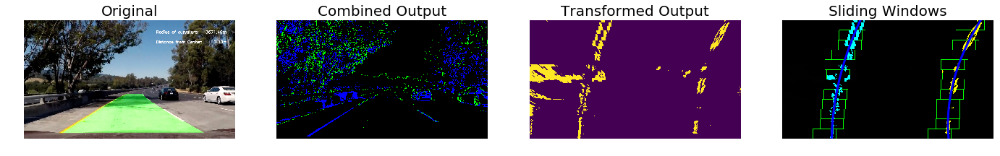

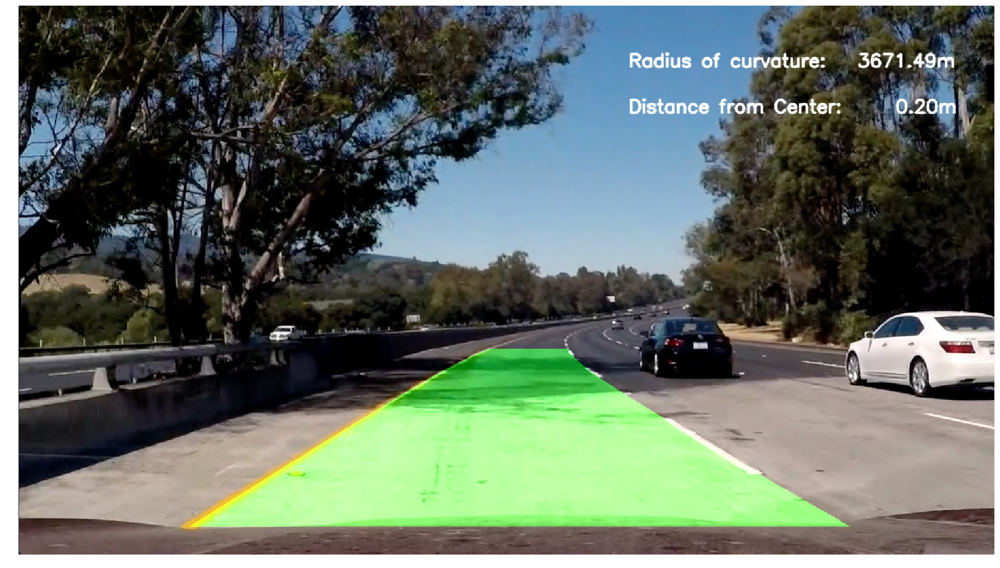

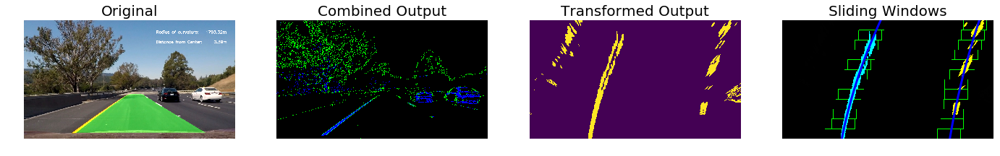

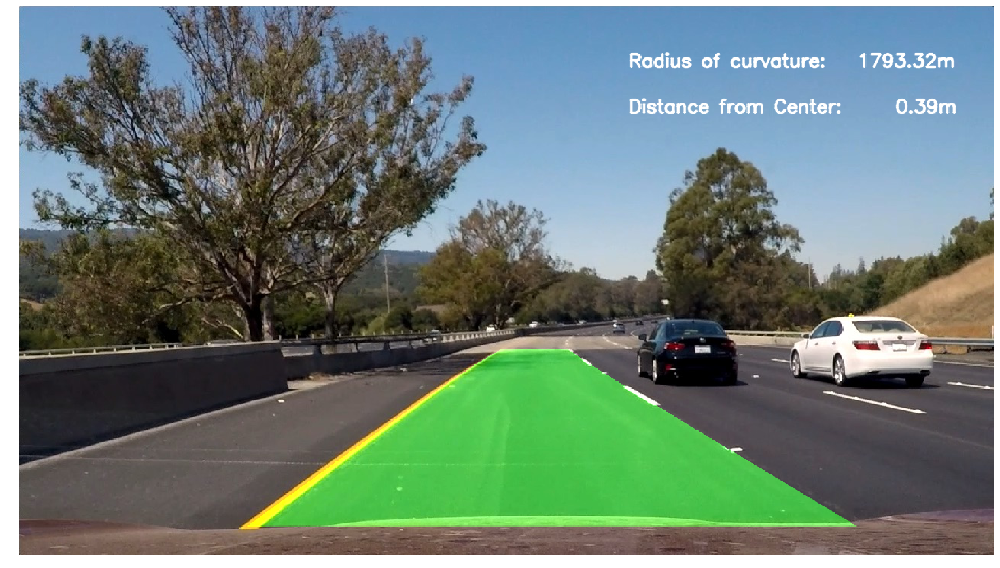

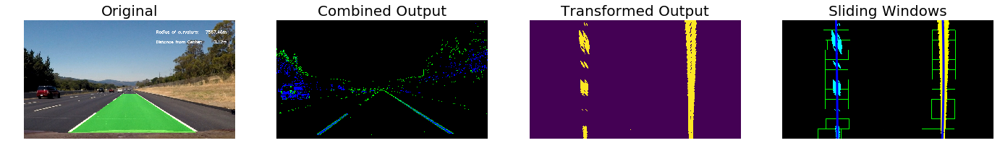

...

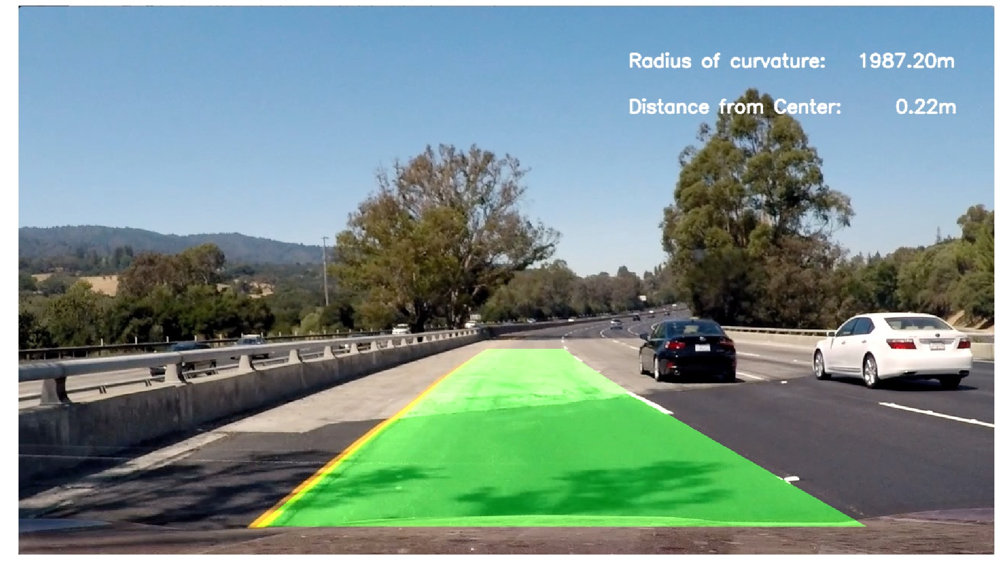

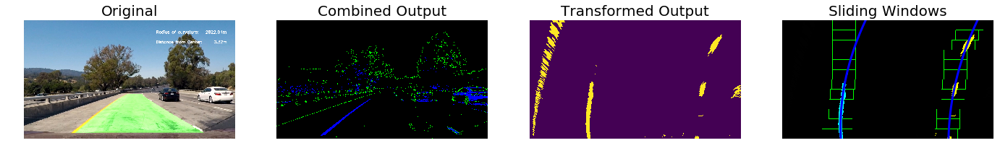

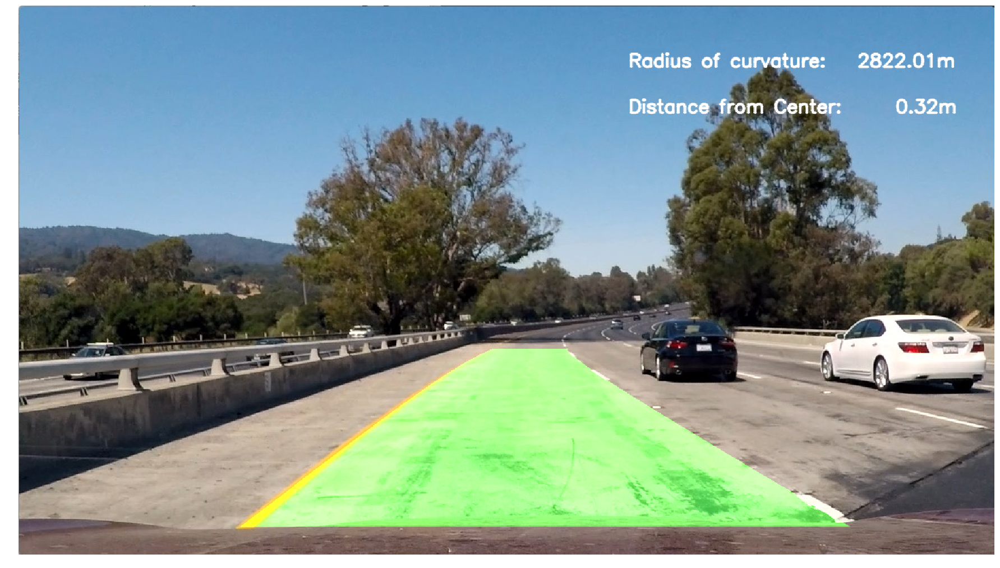

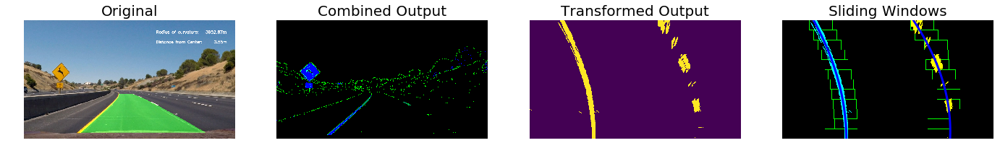

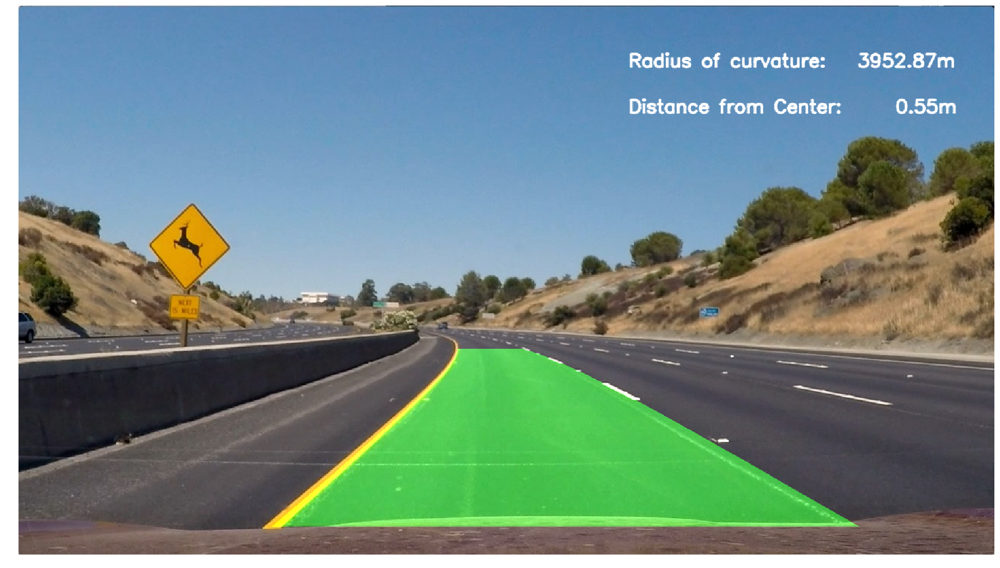

In [16]:
# run camera calibration to obtain mtx and dist in case not done before
mtx,dist=cameraCalibration(saveImages='n')

# clear previous variables in case previous global values exist
if "lCoeffPrev" in globals():
    del lCoeffPrev
    del rCoeffPrev
    switch=False

# test on one img
# filenames = 'test_images/test6.jpg'

# test on all imgs
filenames = 'test_images/*.jpg'

# for each image matching the search criteria
for image in glob.glob(filenames):
    if "lCoeffPrev" in globals():
        del lCoeffPrev
        del rCoeffPrev
    # read the image
    img = mpimg.imread(image)
    # Process the normal pipeline
    result = processImage(img)

#     # Run the pipeline with intermediate images output
#     result = processImageDiagnostic(img)
    plt.figure(figsize=(32,18))
    plt.axis('off')
    plt.imshow(result)
#     mpimg.imsave('output'+image, result)    


### Movie Processing

In [13]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [14]:
# run camera calibration to obtain mtx and dist in case not done before
mtx,dist=cameraCalibration(saveImages='n')

# clear previous variables in case previous global values exist
if "lCoeffPrev" in globals():
    del lCoeffPrev
    del rCoeffPrev
    switch=False

# choose video files
vidOut = 'outputProject.mp4'
vidIn = VideoFileClip('project_video.mp4')
# vidOut = 'outputVideos/outputProjectClip.mp4'
# vidIn = VideoFileClip('project_video.mp4').subclip(40,42)
## clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(5,8)

#process each frame either diagnostically or normally 
videoProcess = vidIn.fl_image(processImage)
# videoProcess = vidIn.fl_image(processImageDiagnostic)

%time videoProcess.write_videofile(vidOut, audio=False)

In [15]:
# HTML("""
# <video width="960" height="540" controls>
#   <source src="{0}">
# </video>
# """.format(vidOut))
